In [1]:
import matplotlib.pyplot as plt
import numpy as np
import os
import torch
import yaml
import random
import pandas as pd
import seaborn as sns
import cv2
import ibllib.io.video as vidio
import matplotlib.gridspec as gridspec
import matplotlib.colors as mcolors
from scipy.interpolate import interp1d
from scipy import stats
from daart.data import DataGenerator
from daart.transforms import ZScore
from daart.models import Segmenter
from one.api import ONE
from brainbox.io.one import SessionLoader
from matplotlib.backends.backend_agg import FigureCanvasAgg as FigureCanvas
from matplotlib.figure import Figure
from sklearn.metrics import f1_score
from sklearn.preprocessing import RobustScaler, MinMaxScaler
from matplotlib.patches import Patch
from matplotlib.colors import ListedColormap
from matplotlib.lines import Line2D
from collections import Counter

import matplotlib.animation as animation
from IPython.display import HTML

# Connect to the IBL database
ONE.setup(base_url='https://openalyx.internationalbrainlab.org', silent=True)
one = ONE(password='international')
pd.set_option('display.max_rows', 500)

/home/nuttidalab/miniconda3/envs/iblenv/lib/python3.10/site-packages/one/params.py:184: UserWarning: Warning: the directory provided is already a cache for another URL.
  warnings.warn('Warning: the directory provided is already a cache for another URL.')


In [2]:
#@config
l_thresh = 0.0
view = 'left'
paw = 'paw_r'

In [3]:
#@static variables
eid_inferred = 'db4df448-e449-4a6f-a0e7-288711e7a75a'
preds = np.load("./stores/state_preds.npy") # (5, 208000)

state_labels = ['Still', 'Move', 'Wheel Turn', 'Groom']
state_keys = {1: 'Still', 2: 'Move', 3: 'Wheel Turn', 4: 'Groom'}
state_map = np.vectorize(lambda x: state_keys[x])

vid_url = vidio.url_from_eid(eid_inferred, one=one)[view]
cap = cv2.VideoCapture(vid_url)
fps = cap.get(cv2.CAP_PROP_FPS)

In [4]:
# Function to extract and/or smooth ibl data
def extract_marker_data(eid, l_thresh, view, paw):
    #sess_id = dropbox_marker_paths[eid]

    # Load the pose data
    sl = SessionLoader(one=one, eid=eid)
    sl.load_pose(likelihood_thr=l_thresh, views=[view])
    times = sl.pose[f'{view}Camera'].times.to_numpy()
    markers = sl.pose[f'{view}Camera'].loc[:, (f'{paw}_x', f'{paw}_y')].to_numpy()

    # Load wheel data
    sl.load_wheel()
    wh_times = sl.wheel.times.to_numpy()
    wh_vel_oversampled = sl.wheel.velocity.to_numpy()
    
    # Resample wheel data at marker times
    interpolator = interp1d(wh_times, wh_vel_oversampled, fill_value='extrapolate')
    wh_vel = interpolator(times)

    # Process the data
    markers_comb = np.hstack([markers, wh_vel[:, None]])
    velocity = np.vstack([np.array([0, 0, 0]), np.diff(markers_comb, axis=0)])
    markers_comb = np.hstack([markers_comb, velocity])
    markers_z = (markers_comb - np.mean(markers_comb, axis=0)) / np.std(markers_comb, axis=0)
    feature_names = ['paw_x_pos', 'paw_y_pos', 'wheel_vel', 'paw_x_vel', 'paw_y_vel', 'wheel_acc']
    df = pd.DataFrame(markers_z, columns=feature_names)
    return df

In [5]:
marker_data = extract_marker_data(eid_inferred, l_thresh, view, paw)

In [6]:
data_df = marker_data.iloc[:208000, :].copy()

# Calculate the ensemble mode for each frame across the models
ensemble_mode = stats.mode(preds, axis=0).mode

# Calculate variance for each frame across the models
ensemble_variance = stats.variation(preds, axis=0)

# calculate the paw speed
data_df['paw_speed'] = np.sqrt(data_df['paw_x_vel']**2 + data_df['paw_y_vel']**2)

# calculate the wheel speed
data_df['wheel_speed'] = data_df['wheel_vel'].abs()

# Add the inferred states to the data
preds_labelled = state_map(preds)
for i in range(0, 5):
    data_df[f'mod_{i+1}'] = preds_labelled[i]

# add them all do the data frame
data_df['e_mode'] = state_map(ensemble_mode)
data_df['e_var'] = ensemble_variance
data_df['frame_id'] = np.arange(0, len(data_df))

# organize the columns:
cols = ['paw_x_pos', 'paw_y_pos', 'paw_x_vel', 'paw_y_vel', 'paw_speed',
        'wheel_vel', 'wheel_speed', 'wheel_acc',
        'mod_1', 'mod_2', 'mod_3', 'mod_4', 'mod_5', 'e_mode', 'e_var', 'frame_id']

# reorder the columns
data_df = data_df[cols]

data_df.round(2)

,paw_x_pos,paw_y_pos,paw_x_vel,paw_y_vel,paw_speed,wheel_vel,wheel_speed,wheel_acc,mod_1,mod_2,mod_3,mod_4,mod_5,e_mode,e_var,frame_id
0,-3.01,-8.00,-0.00,-0.00,0.00,0.04,0.04,-0.00,Groom,Groom,Groom,Groom,Groom,Groom,0.0,0
1,-2.97,-8.00,0.62,-0.00,0.62,0.04,0.04,-0.00,Groom,Groom,Groom,Groom,Groom,Groom,0.0,1
2,-2.94,-8.00,0.38,-0.00,0.38,0.04,0.04,-0.00,Groom,Groom,Groom,Groom,Groom,Groom,0.0,2
3,-2.94,-8.03,-0.00,-0.34,0.34,0.04,0.04,-0.00,Groom,Groom,Groom,Groom,Groom,Groom,0.0,3
4,-2.92,-8.03,0.26,-0.00,0.26,0.04,0.04,-0.00,Groom,Groom,Groom,Groom,Groom,Groom,0.0,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
207995,-0.22,-0.80,0.00,0.00,0.00,0.04,0.04,0.02,Still,Still,Still,Still,Still,Still,0.0,207995
207996,-0.22,-0.80,0.01,0.01,0.01,0.04,0.04,-0.00,Still,Still,Still,Still,Still,Still,0.0,207996
207997,-0.22,-0.80,0.01,0.01,0.01,0.04,0.04,-0.01,Still,Still,Still,Still,Still,Still,0.0,207997
207998,-0.22,-0.80,-0.00,-0.00,0.00,0.04,0.04,0.01,Still,Still,Still,Still,Still,Still,0.0,207998


## wheel speed conditoioned
wheel speed (not velocity) conditioned on still → wheel_turn, and a separate panel conditioned on wheel_turn → still

In [7]:
# Identify transition frames
model_to_use = 'e_mode'

still_to_wheel_turn_frames = data_df[
    (data_df[model_to_use].shift() == 'Still') & (data_df[model_to_use] == 'Wheel Turn')
].index

wheel_turn_to_still_frames = data_df[
    (data_df[model_to_use].shift() == 'Wheel Turn') & (data_df[model_to_use] == 'Still')
].index

still_to_move_frames = data_df[
    (data_df[model_to_use].shift() == 'Still') & (data_df[model_to_use] == 'Move')
].index

move_to_still_frames = data_df[
    (data_df[model_to_use].shift() == 'Move') & (data_df[model_to_use] == 'Still')
].index

In [8]:
# Extract transition data with -50 to +100 frames around transitions
def extract_transition_data_with_window(frames, data, data_col, pre_window=50, post_window=100):
    transition_data = []
    for frame in frames:
        if frame - pre_window >= 0 and frame + post_window < len(data):  # Ensure bounds
            transition_data.append(data.iloc[frame - pre_window:frame + post_window][data_col].values)
    return np.array(transition_data)


In [9]:
still_to_wheel_turn_data = extract_transition_data_with_window(still_to_wheel_turn_frames, data_df, data_col="wheel_speed")
wheel_turn_to_still_data = extract_transition_data_with_window(wheel_turn_to_still_frames, data_df, data_col="wheel_speed")

still_to_wheel_turn_avg = still_to_wheel_turn_data.mean(axis=0)
wheel_turn_to_still_avg = wheel_turn_to_still_data.mean(axis=0)


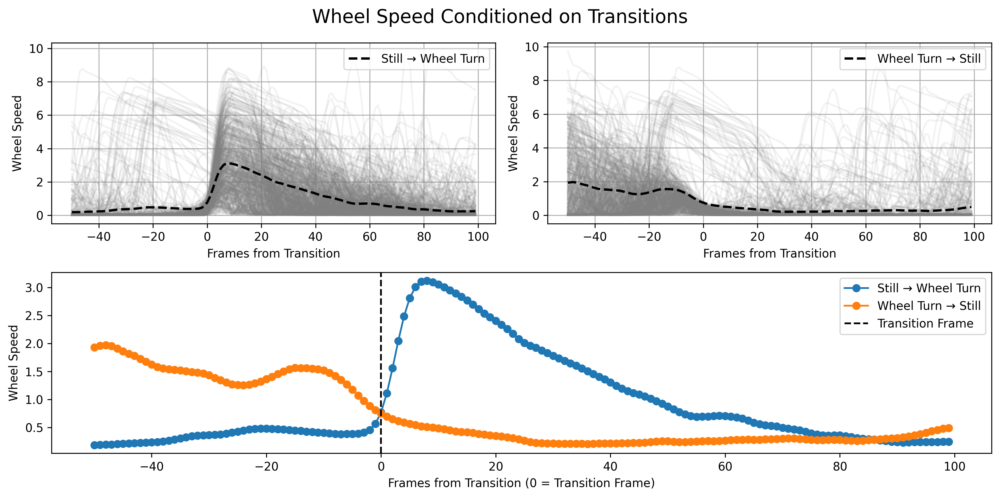

In [10]:
# Plot
fig = plt.figure(figsize=(12, 6), dpi=300)

# Create subplots
ax1 = plt.subplot2grid((2, 2), (0, 0))
ax2 = plt.subplot2grid((2, 2), (0, 1))
ax3 = plt.subplot2grid((2, 2), (1, 0), colspan=2)

x = np.arange(-50,100,1)  # 100 frames
alpha = 0.1

for line in still_to_wheel_turn_data:
    ax1.plot(x, line, color="gray", alpha=alpha)
ax1.plot(x, still_to_wheel_turn_avg, "k--", label="Still → Wheel Turn", linewidth=2)

for line in wheel_turn_to_still_data:
    ax2.plot(x, line, color="gray", alpha=alpha)
ax2.plot(x, wheel_turn_to_still_avg, "k--", label="Wheel Turn → Still", linewidth=2)

for a in [ax1, ax2]:
    # a.set_title("Wheel Speed Transitions")
    a.set_xlabel("Frames from Transition")
    a.set_ylabel("Wheel Speed")
    a.legend(loc='upper right')
    a.grid()

# Now the big boi
ax3.plot(x, still_to_wheel_turn_avg, label="Still → Wheel Turn", marker="o")
ax3.plot(x, wheel_turn_to_still_avg, label="Wheel Turn → Still", marker="o")

ax3.axvline(0, color='k', linestyle='--', label="Transition Frame")  # Highlight transition frame
# ax3.set_title("Wheel Speed Transitions (-50 to +100 Frames)")
ax3.set_xlabel("Frames from Transition (0 = Transition Frame)")
ax3.set_ylabel("Wheel Speed")
ax3.legend()
# ax3.grid()

plt.suptitle("Wheel Speed Conditioned on Transitions", fontsize=16)
plt.tight_layout()
plt.show()

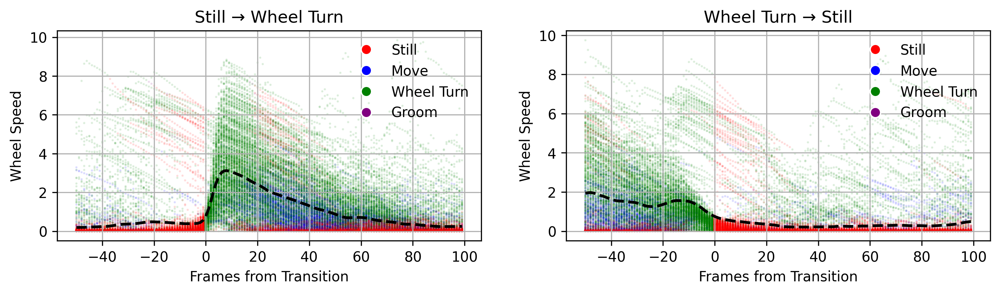

In [11]:
# inv_map = {v: k for k, v in state_keys.items()}
col_map = {"red": "Still", "blue": "Move", "green": "Wheel Turn", "purple": "Groom"}
inv_map = {"Still": "red", "Move": "blue", "Wheel Turn": "green", "Groom": "purple"}

still_to_wheel_turn_preds = []
for frame in still_to_wheel_turn_frames:
    still_to_wheel_turn_preds.append(data_df.iloc[frame-50:frame+100]['e_mode'].values)
still_to_wheel_turn_preds = np.array(still_to_wheel_turn_preds)
still_to_wheel_turn_preds = np.vectorize(lambda x: inv_map[x])(still_to_wheel_turn_preds)


wheel_turn_to_still_preds = []
for frame in wheel_turn_to_still_frames:
    wheel_turn_to_still_preds.append(data_df.iloc[frame-50:frame+100]['e_mode'].values)
wheel_turn_to_still_preds = np.array(wheel_turn_to_still_preds)
wheel_turn_to_still_preds = np.vectorize(lambda x: inv_map[x])(wheel_turn_to_still_preds)

# Plot
fig = plt.figure(figsize=(12, 6), dpi=300)

# Create subplots
ax1 = plt.subplot2grid((2, 2), (0, 0))
ax2 = plt.subplot2grid((2, 2), (0, 1))

x = np.arange(-50,100,1)  # 100 frames
alpha = 0.1

for idx, line in enumerate(still_to_wheel_turn_data):
    ax1.scatter(x, line, c=still_to_wheel_turn_preds[idx], marker=".", alpha=alpha, s=2)
ax1.plot(x, still_to_wheel_turn_avg, "k--", label="Still → Wheel Turn", linewidth=2)
ax1.set_title("Still → Wheel Turn")


for idx, line in enumerate(wheel_turn_to_still_data):
    ax2.scatter(x, line, c=wheel_turn_to_still_preds[idx], marker=".", alpha=alpha, s=2)
ax2.plot(x, wheel_turn_to_still_avg, "k--", label="Wheel Turn → Still", linewidth=2)
ax2.set_title("Wheel Turn → Still")

for a in [ax1, ax2]:
    # a.set_title("Wheel Speed Transitions")
    a.set_xlabel("Frames from Transition")
    a.set_ylabel("Wheel Speed")
    # a.legend(loc='upper right')
    a.legend( [Line2D([0], [0], marker='.', color='w', markerfacecolor='red', markersize=15),
            Line2D([0], [0], marker='.', color='w', markerfacecolor='blue', markersize=15),
            Line2D([0], [0], marker='.', color='w', markerfacecolor='green', markersize=15),
            Line2D([0], [0], marker='.', color='w', markerfacecolor='purple', markersize=15)],
            ['Still', 'Move', 'Wheel Turn', 'Groom'], loc='upper right', frameon=False)
    a.grid()

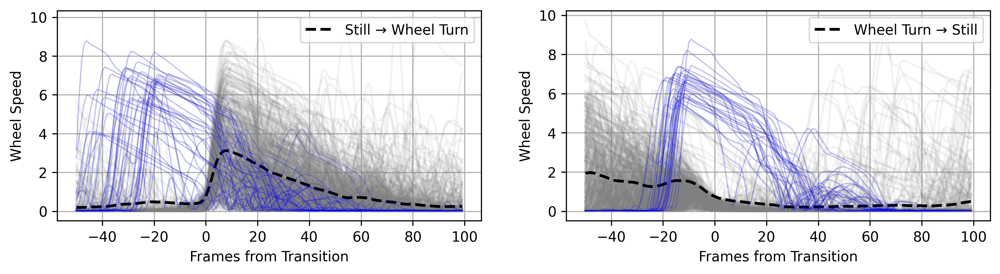

In [12]:
# Plot
fig = plt.figure(figsize=(12, 6), dpi=300)

# Create subplots
ax1 = plt.subplot2grid((2, 2), (0, 0))
ax2 = plt.subplot2grid((2, 2), (0, 1))

x = np.arange(-50,100,1)  # 100 frames
alpha = 0.1

for line in still_to_wheel_turn_data:
    ax1.plot(x, line, color="gray", alpha=alpha)
ax1.plot(x, still_to_wheel_turn_avg, "k--", label="Still → Wheel Turn", linewidth=2)

for line in wheel_turn_to_still_data:
    ax2.plot(x, line, color="gray", alpha=alpha)
ax2.plot(x, wheel_turn_to_still_avg, "k--", label="Wheel Turn → Still", linewidth=2)

for line in still_to_wheel_turn_data[still_to_wheel_turn_data[:, 30]>2]:
    ax1.plot(x, line, 'b-', alpha=0.3, linewidth=0.5)

for line in wheel_turn_to_still_data[wheel_turn_to_still_data[:, 50]>4]:
    ax2.plot(x, line, 'b-', alpha=0.3, linewidth=0.5)

for a in [ax1, ax2]:
    # a.set_title("Wheel Speed Transitions")
    a.set_xlabel("Frames from Transition")
    a.set_ylabel("Wheel Speed")
    a.legend(loc='upper right')
    a.grid()

## Wheel speed conditioned but filtered by the duration of the frames (10 frame counter)

In [84]:
model_to_use = 'e_mode'
frame_counter_duration = 20

# Add a column to track when the state changes
data_df['state_change'] = (data_df[model_to_use] != data_df[model_to_use].shift()).cumsum()

# Compute the duration of each state block
data_df['state_duration'] = data_df.groupby('state_change').cumcount() + 1

# Reverse duration for the next state (counting backward)
data_df['state_duration_next'] = data_df[::-1].groupby('state_change').cumcount() + 1
# Ensure the previous state lasted at least 10 frames and the next state will last at least 10 frames
still_to_wheel_turn_frames = data_df[
    (data_df[model_to_use].shift() == 'Still') & 
    (data_df[model_to_use] == 'Wheel Turn') & 
    (data_df['state_duration'].shift() >= frame_counter_duration) & 
    (data_df['state_duration_next'] >= frame_counter_duration)
].index

wheel_turn_to_still_frames = data_df[
    (data_df[model_to_use].shift() == 'Wheel Turn') & 
    (data_df[model_to_use] == 'Still') & 
    (data_df['state_duration'].shift() >= frame_counter_duration) & 
    (data_df['state_duration_next'] >= frame_counter_duration)
].index

still_to_move_frames = data_df[
    (data_df[model_to_use].shift() == 'Still') & 
    (data_df[model_to_use] == 'Move') & 
    (data_df['state_duration'].shift() >= frame_counter_duration) & 
    (data_df['state_duration_next'] >= frame_counter_duration)
].index

move_to_still_frames = data_df[
    (data_df[model_to_use].shift() == 'Move') & 
    (data_df[model_to_use] == 'Still') & 
    (data_df['state_duration'].shift() >= frame_counter_duration) & 
    (data_df['state_duration_next'] >= frame_counter_duration)
].index

In [85]:
still_to_wheel_turn_data = extract_transition_data_with_window(still_to_wheel_turn_frames, data_df, data_col="wheel_speed")
wheel_turn_to_still_data = extract_transition_data_with_window(wheel_turn_to_still_frames, data_df, data_col="wheel_speed")

still_to_wheel_turn_avg = still_to_wheel_turn_data.mean(axis=0)
wheel_turn_to_still_avg = wheel_turn_to_still_data.mean(axis=0)

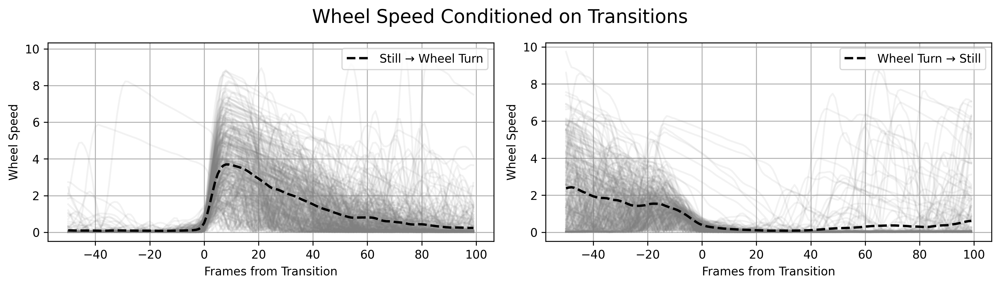

In [86]:
# Plot
# sns.set_style("whitegrid")
plt.style.use('default')
fig = plt.figure(figsize=(12, 6), dpi=300)

# Create subplots
ax1 = plt.subplot2grid((2, 2), (0, 0))
ax2 = plt.subplot2grid((2, 2), (0, 1))
# ax3 = plt.subplot2grid((2, 2), (1, 0), colspan=2)

x = np.arange(-50,100,1)  # 100 frames
alpha = 0.1

for line in still_to_wheel_turn_data:
    ax1.plot(x, line, color="gray", alpha=alpha)
ax1.plot(x, still_to_wheel_turn_avg, "k--", label="Still → Wheel Turn", linewidth=2)

for line in wheel_turn_to_still_data:
    ax2.plot(x, line, color="gray", alpha=alpha)
ax2.plot(x, wheel_turn_to_still_avg, "k--", label="Wheel Turn → Still", linewidth=2)

for a in [ax1, ax2]:
    # a.set_title("Wheel Speed Transitions")
    a.set_xlabel("Frames from Transition")
    a.set_ylabel("Wheel Speed")
    a.legend(loc='upper right')
    a.grid()

# # Now the big boi
# ax3.plot(x, still_to_wheel_turn_avg, label="Still → Wheel Turn", marker="o")
# ax3.plot(x, wheel_turn_to_still_avg, label="Wheel Turn → Still", marker="o")

# ax3.axvline(0, color='k', linestyle='--', label="Transition Frame")  # Highlight transition frame
# # ax3.set_title("Wheel Speed Transitions (-50 to +100 Frames)")
# ax3.set_xlabel("Frames from Transition (0 = Transition Frame)")
# ax3.set_ylabel("Wheel Speed")
# ax3.legend()
# # ax3.grid()

plt.suptitle("Wheel Speed Conditioned on Transitions", fontsize=16)
plt.tight_layout()
plt.show()

In [87]:
still_to_wheel_turn_preds.shape, still_to_wheel_turn_frames.shape, still_to_wheel_turn_data.shape

((486, 150), (291,), (291, 150))

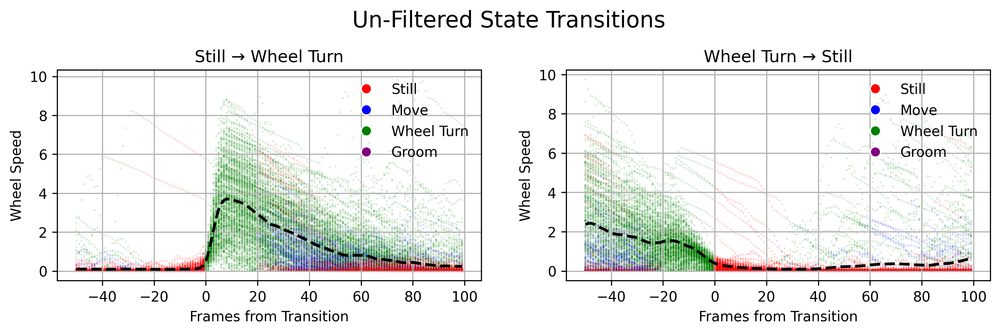

In [88]:
# inv_map = {v: k for k, v in state_keys.items()}
col_map = {"red": "Still", "blue": "Move", "green": "Wheel Turn", "purple": "Groom"}
inv_map = {"Still": "red", "Move": "blue", "Wheel Turn": "green", "Groom": "purple"}

still_to_wheel_turn_preds = []
for frame in still_to_wheel_turn_frames:
    still_to_wheel_turn_preds.append(data_df.iloc[frame-50:frame+100]['e_mode'].values)
still_to_wheel_turn_preds = np.array(still_to_wheel_turn_preds)
still_to_wheel_turn_preds = np.vectorize(lambda x: inv_map[x])(still_to_wheel_turn_preds)


wheel_turn_to_still_preds = []
for frame in wheel_turn_to_still_frames:
    wheel_turn_to_still_preds.append(data_df.iloc[frame-50:frame+100]['e_mode'].values)
wheel_turn_to_still_preds = np.array(wheel_turn_to_still_preds)
wheel_turn_to_still_preds = np.vectorize(lambda x: inv_map[x])(wheel_turn_to_still_preds)

# Plot
fig = plt.figure(figsize=(12, 6), dpi=300)

# Create subplots
ax1 = plt.subplot2grid((2, 2), (0, 0))
ax2 = plt.subplot2grid((2, 2), (0, 1))

x = np.arange(-50,100,1)  # 100 frames
alpha = 0.1

for idx, line in enumerate(still_to_wheel_turn_data):
    cols = still_to_wheel_turn_preds[idx]
    ax1.scatter(x, line, c=cols, marker=".", alpha=alpha, s=2)
ax1.plot(x, still_to_wheel_turn_avg, "k--", label="Still → Wheel Turn", linewidth=2)
ax1.set_title("Still → Wheel Turn")


for idx, line in enumerate(wheel_turn_to_still_data):
    ax2.scatter(x, line, c=wheel_turn_to_still_preds[idx], marker=".", alpha=alpha, s=2)
ax2.plot(x, wheel_turn_to_still_avg, "k--", label="Wheel Turn → Still", linewidth=2)
ax2.set_title("Wheel Turn → Still")

for a in [ax1, ax2]:
    # a.set_title("Wheel Speed Transitions")
    a.set_xlabel("Frames from Transition")
    a.set_ylabel("Wheel Speed")
    # a.legend(loc='upper right')
    a.legend( [Line2D([0], [0], marker='.', color='w', markerfacecolor='red', markersize=15),
            Line2D([0], [0], marker='.', color='w', markerfacecolor='blue', markersize=15),
            Line2D([0], [0], marker='.', color='w', markerfacecolor='green', markersize=15),
            Line2D([0], [0], marker='.', color='w', markerfacecolor='purple', markersize=15)],
            ['Still', 'Move', 'Wheel Turn', 'Groom'], loc='upper right', frameon=False)
    a.grid()

# plt.suptitle("Filtered Out Where State duration before or after <10f", fontsize=16)
plt.suptitle("Un-Filtered State Transitions", fontsize=16)
plt.show()

## Video viz inspection with ethogram

In [92]:
def get_video_frames(start, end):
    
    # read the video frames
    cap = cv2.VideoCapture(vid_url)

    our_frames = []
    for i in range(0, end):
        ret, frame = cap.read()
        if i >= start:
            our_frames.append(frame)

    # Release the VideoCapture object
    cap.release()
    return np.array(our_frames)

def plot_video_with_etho(qline, qline_idx, q_frames, data, questionable_lines, questionable_preds, questionable_etho, speed_threshold=2, title="Still → Wheel Turn"):
    plt.style.use('dark_background')

    # Create the figure and gridspec
    fig = plt.figure(figsize=(15, 8), dpi=300)


    # Specify height ratios: 7 equal parts for ethograms and 1 large part for speed
    gs = fig.add_gridspec(8, 2, height_ratios=[6, 1, 1, 1, 1, 1, 1, 1])


    # ============= Speed Plot =============
    # Plot the speed data
    # ============= Speed Plot =============

    # Create subplot for speed
    speed_ax = fig.add_subplot(gs[0, 0])  # Row 7 in the left column

    alpha = 0.1
    x = np.arange(-50,100,1)  # 150 frames

    for line in data: speed_ax.plot(x, line, color="gray", alpha=alpha)
    speed_ax.plot(x, data.mean(axis=0), "k--", label="Still → Wheel Turn", linewidth=2)

    speed_ax.legend( [Line2D([0], [0], marker='.', color='w', markerfacecolor='red', markersize=15),
            Line2D([0], [0], marker='.', color='w', markerfacecolor='blue', markersize=15),
            Line2D([0], [0], marker='.', color='w', markerfacecolor='green', markersize=15),
            Line2D([0], [0], marker='.', color='w', markerfacecolor='purple', markersize=15)],
            ['Still', 'Move', 'Wheel Turn', 'Groom'], loc='upper right', frameon=False)
    for line in data[data[:, 30]>speed_threshold]: speed_ax.plot(x, line, c="cyan", alpha=0.3, linewidth=0.5)

    # specific rail
    qtrain, = speed_ax.plot(x, questionable_lines[qline], c='white', alpha=1, linewidth=1)
    point = speed_ax.scatter(0, 0, color='white', s=100, zorder=10)

    speed_ax.set_title(title)
    speed_ax.set_ylabel("Wheel Speed")
    speed_ax.spines["top"].set_visible(False)
    speed_ax.spines["right"].set_visible(False)
    speed_ax.set_xlim(-50, 100)
    speed_ax.set_xticks([])
    speed_ax.grid()


    # ============= Ethograms =============
    # Create a colormap for the ethogram same as the speed plot
    # ============= Ethograms ============= 

    # Create subplots for ethograms
    ethogram_axes = [fig.add_subplot(gs[i, 0]) for i in range(1,8)]  # Rows 0 to 6 in the left column


    etho = questionable_etho[qline].T
    inv_map = {v: k for k, v in state_keys.items()}
    predictions_numeric = np.vectorize(inv_map.get)(etho[:6])

    # Create a colormap for the ethogram same as the speed plot
    colors = ['red', 'blue', 'green', 'purple']
    cmap = ListedColormap(colors)

    # Plot each model's predictions as a continuous color block
    for i in range(5):
        ethogram_axes[i].imshow(predictions_numeric[i].reshape(1, -1), aspect='auto', cmap=cmap, vmin=0, vmax=5)
        # ethogram_axes[i].axis('off')
        ethogram_axes[i].set_ylabel(f"M{i+1}")
        ethogram_axes[i].tick_params(left=False, labelleft=False, bottom=False, labelbottom=False)  # Hide y-axis ticks for

    # Plot the ensemble mode
    ethogram_axes[5].imshow(predictions_numeric[5].reshape(1, -1), aspect='auto', cmap=cmap, vmin=0, vmax=5)
    ethogram_axes[5].set_ylabel("Ens")
    ethogram_axes[5].tick_params(left=False, labelleft=False, bottom=False, labelbottom=False)

    # Plot the ensemble variance
    ethogram_axes[6].imshow(etho[6].astype(float).reshape(1, -1), aspect='auto', cmap='Greys')
    ethogram_axes[6].set_ylabel("Var")
    ethogram_axes[6].tick_params(left=False, labelleft=False, bottom=True, labelbottom=True)
    # reset the x-axis ticks from 0 to 150 to -50 to 100
    ethogram_axes[6].set_xticks(np.arange(0, 150, 25))
    ethogram_axes[6].set_xticklabels(np.arange(-50, 100, 25))


    ethogram_axes[6].set_xlabel("Frames from Transition")

    # ============= Video =============
    # Create a subplot for the video
    # ============= Video =============

    # Create subplot for the right column spanning all rows
    video_ax = fig.add_subplot(gs[:6, 1])  # All rows in the right column

    mouse_img = video_ax.imshow(q_frames[0])
    ttx = video_ax.text(0.8, 0.2, '', fontsize=12, color='white', ha='center', va="center", transform=video_ax.transAxes, backgroundcolor='white')

    video_ax.axis('off')

    # ============= Meta =============
    # Create a subplot for the meta data
    # ============= Meta =============

    meta_ax = fig.add_subplot(gs[6:, 1])

    # lets print some metadata here
    font_size = 10
    # Eid number and session
    meta_ax.text(0, 0.9, f"EID: {eid_inferred}", fontsize=font_size, ha='left', va='center')
    meta_ax.text(0, 0.7, f"{str(one.eid2path(eid_inferred)).split('/')[-5:]}", fontsize=font_size, ha='left', va='center')

    meta_ax.text(0, 0.5, f"Currently inspecting:", fontsize=font_size, ha='left', va='center')
    meta_ax.text(0.1, 0.3, f"Still → Wheel Turn transition frame index: {qline_idx}", fontsize=font_size, ha='left', va='center')
    frame_counter = meta_ax.text(0.1, 0.1, f"Current frame index: ", fontsize=font_size, ha='left', va='center')

    # Customize the meta plot
    meta_ax.set_xticklabels([])
    meta_ax.set_yticklabels([])

    # plt.suptitle("Wheel Speed Conditioned on Still → Wheel Turn")
    # plt.tight_layout()
    plt.subplots_adjust(wspace=0.1)
    # plt.show()

    def animate(i):
        x_value = x[i]
        y_value = questionable_lines[qline][i]
        c_value = questionable_preds[qline][i]

        qtrain.set_color(c_value)
        point.set_offsets(np.c_[x_value, y_value])
        point.set_color(c_value)

        mouse_img.set_data(q_frames[i])
        ttx.set_text(col_map[c_value])
        ttx.set_backgroundcolor(c_value)

        frame_counter.set_text(f"Current frame index: {qline_idx - 50 + i}")

        return point

    ani = animation.FuncAnimation(fig, animate, frames=150, interval=60, blit=False, cache_frame_data=False)
    plt.close()
    return ani
    

In [93]:
still_to_wheel_turn_etho = []
for frame in still_to_wheel_turn_frames:
    still_to_wheel_turn_etho.append(data_df.iloc[frame-50:frame+100][['mod_1','mod_2','mod_3','mod_4','mod_5','e_mode', 'e_var']].values)
still_to_wheel_turn_etho = np.array(still_to_wheel_turn_etho)

wheel_turn_to_still_etho = []
for frame in wheel_turn_to_still_frames:
    wheel_turn_to_still_etho.append(data_df.iloc[frame-50:frame+100][['mod_1','mod_2','mod_3','mod_4','mod_5','e_mode', 'e_var']].values)
wheel_turn_to_still_etho = np.array(wheel_turn_to_still_etho)

In [ ]:
# FOR STILL TO WHEEL TURN
#qline = 10 # Example of typical transition
qline = 1

questionable_mask = still_to_wheel_turn_data[:, 30]>2
# Data
questionable_lines = still_to_wheel_turn_data[questionable_mask]
questionable_preds = still_to_wheel_turn_preds[questionable_mask]
questionable_frames = still_to_wheel_turn_frames[questionable_mask]
questionable_etho = still_to_wheel_turn_etho[questionable_mask]

# questionable_lines = still_to_wheel_turn_data
# questionable_preds = still_to_wheel_turn_preds

qline_idx = questionable_frames[qline]
q_frames = get_video_frames(qline_idx - 50, qline_idx + 100)

ani = plot_video_with_etho(qline, qline_idx, q_frames, still_to_wheel_turn_data, questionable_lines, questionable_preds, questionable_etho, speed_threshold=2, title="Still → Wheel Turn")

HTML(ani.to_html5_video())

In [ ]:
# FOR WHEEL TURN TO STILL
#qline = 10 # Example of typical transition
qline = 1

questionable_mask = wheel_turn_to_still_data[:, 30]>4

# Data
questionable_lines = wheel_turn_to_still_data[questionable_mask]
questionable_preds = wheel_turn_to_still_preds[questionable_mask]
questionable_frames = wheel_turn_to_still_frames[questionable_mask]
questionable_etho = wheel_turn_to_still_etho[questionable_mask]

# questionable_lines = wheel_turn_to_still_data
# questionable_preds = wheel_turn_to_still_preds

qline_idx = questionable_frames[qline]
q_frames = get_video_frames(qline_idx - 50, qline_idx + 100)

ani = plot_video_with_etho(qline, qline_idx, q_frames, wheel_turn_to_still_data, questionable_lines, questionable_preds, questionable_etho, speed_threshold=4, title="Wheel Turn → Still")
HTML(ani.to_html5_video())

## paw speed conditioned
```
still->wheel_turn
wheel_turn->still
still->move
move->still
```

In [101]:
still_to_wheel_turn_data = extract_transition_data_with_window(still_to_wheel_turn_frames, data_df, data_col="paw_speed")
wheel_turn_to_still_data = extract_transition_data_with_window(wheel_turn_to_still_frames, data_df, data_col="paw_speed")
still_to_move_data = extract_transition_data_with_window(still_to_move_frames, data_df, data_col="paw_speed")
move_to_still_data = extract_transition_data_with_window(move_to_still_frames, data_df, data_col="paw_speed")

still_to_wheel_turn_avg = still_to_wheel_turn_data.mean(axis=0)
wheel_turn_to_still_avg = wheel_turn_to_still_data.mean(axis=0)
still_to_move_avg = still_to_move_data.mean(axis=0)
move_to_still_avg = move_to_still_data.mean(axis=0)

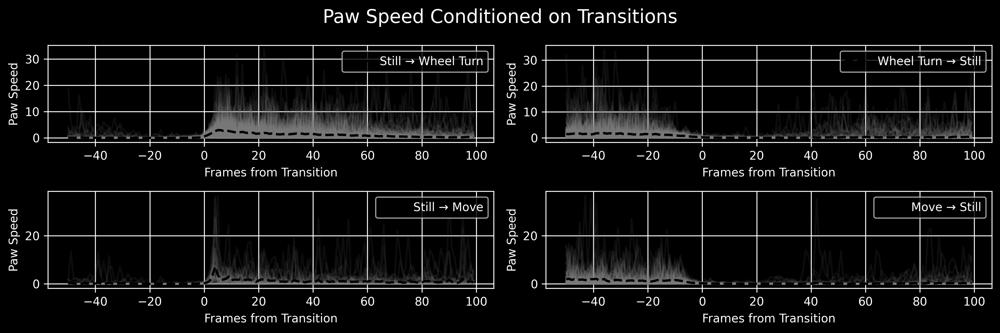

In [102]:
fig, ax = plt.subplots(2, 2, figsize=(12, 4), dpi=300)

x = np.arange(-50,100,1)  # 100 frames

alpha = 0.1

for line in still_to_wheel_turn_data:
    ax[0, 0].plot(x, line, color="gray", alpha=alpha)
ax[0, 0].plot(x, still_to_wheel_turn_avg, "k--", label="Still → Wheel Turn", linewidth=2)

for line in wheel_turn_to_still_data:
    ax[0, 1].plot(x, line, color="gray", alpha=alpha)
ax[0, 1].plot(x, wheel_turn_to_still_avg, "k--", label="Wheel Turn → Still", linewidth=2)

for line in still_to_move_data:
    ax[1, 0].plot(x, line, color="gray", alpha=alpha)
ax[1, 0].plot(x, still_to_move_avg, "k--", label="Still → Move", linewidth=2)

for line in move_to_still_data:
    ax[1, 1].plot(x, line, color="gray", alpha=alpha)
ax[1, 1].plot(x, move_to_still_avg, "k--", label="Move → Still", linewidth=2)

for a in ax.flatten():
    a.set_xlabel("Frames from Transition")
    a.set_ylabel("Paw Speed")
    # a.set_ylim(0, 6)
    a.legend(loc='upper right')
    a.grid()

plt.suptitle("Paw Speed Conditioned on Transitions", fontsize=16)
plt.tight_layout()
plt.show()

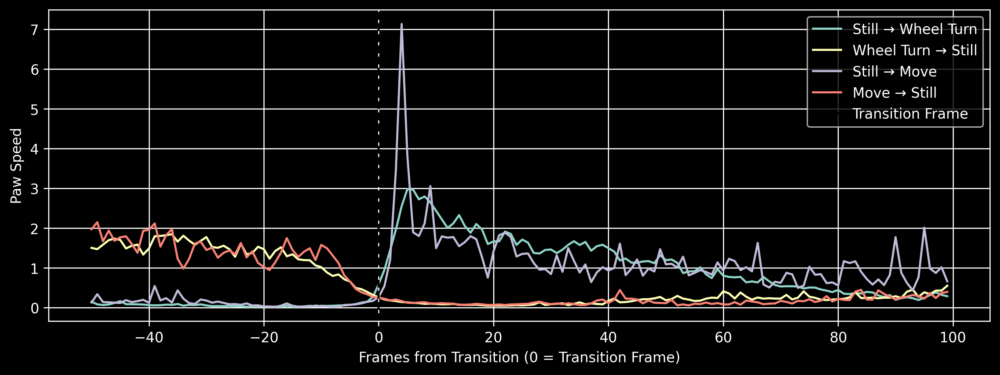

In [103]:
fig, ax = plt.subplots(1,1, figsize=(12, 4), dpi=300)

x = np.arange(-50,100,1)

lines = [still_to_wheel_turn_avg, wheel_turn_to_still_avg, still_to_move_avg, move_to_still_avg]

for i, line_name in enumerate(["Still → Wheel Turn", "Wheel Turn → Still", "Still → Move", "Move → Still"]):
    ax.plot(x, lines[i], label=line_name)

ax.axvline(0, color='k', linestyle='--', label="Transition Frame")  # Highlight transition frame
ax.set_xlabel("Frames from Transition (0 = Transition Frame)")
ax.set_ylabel("Paw Speed")
ax.legend()
ax.grid()

## frames overlayed with markers

frames overlaid with markers - is there a way we can add more information here? like maybe the points can have an alpha value that corresponds to their speed, such that points when the paw is moving are more colorful, and points when the paw is still are more transparent. that way the "still" paw locations panel can tell us a bit more about whether or not the paw is actually moving there

In [118]:
frame = get_video_frames(1000,1001)[0]

In [119]:
frame_marker_df = data_df.copy()

sl = SessionLoader(one=one, eid=eid_inferred)
sl.load_pose(likelihood_thr=l_thresh, views=[view])
marker_px = sl.pose[f'{view}Camera'].loc[:, (f'{paw}_x', f'{paw}_y')].to_numpy()[:208000, :].T

frame_marker_df['paw_x_pos'] = marker_px[0]
frame_marker_df['paw_y_pos'] = marker_px[1]

# robustscaler = RobustScaler( quantile_range = (25, 75))
# minmaxer = MinMaxScaler()
# frame_marker_df['paw_speed_normalized'] = robustscaler.fit_transform(data_df[['paw_speed']])
# frame_marker_df['paw_speed_normalized'] = minmaxer.fit_transform(frame_marker_df[['paw_speed_normalized']])
# frame_marker_df['paw_speed_normalized'] = np.clip(frame_marker_df['paw_speed_normalized']*9, 0, 1)
frame_marker_df['paw_speed_normalized'] = np.clip(frame_marker_df['paw_speed']*9, 0, 30)
# frame_marker_df.dropna(inplace=True)
# frame_marker_df['paw_speed_normalized'] = (frame_marker_df['paw_speed_normalized'] - frame_marker_df['paw_speed_normalized'].min()) / (frame_marker_df['paw_speed_normalized'].max() - frame_marker_df['paw_speed_normalized'].min())

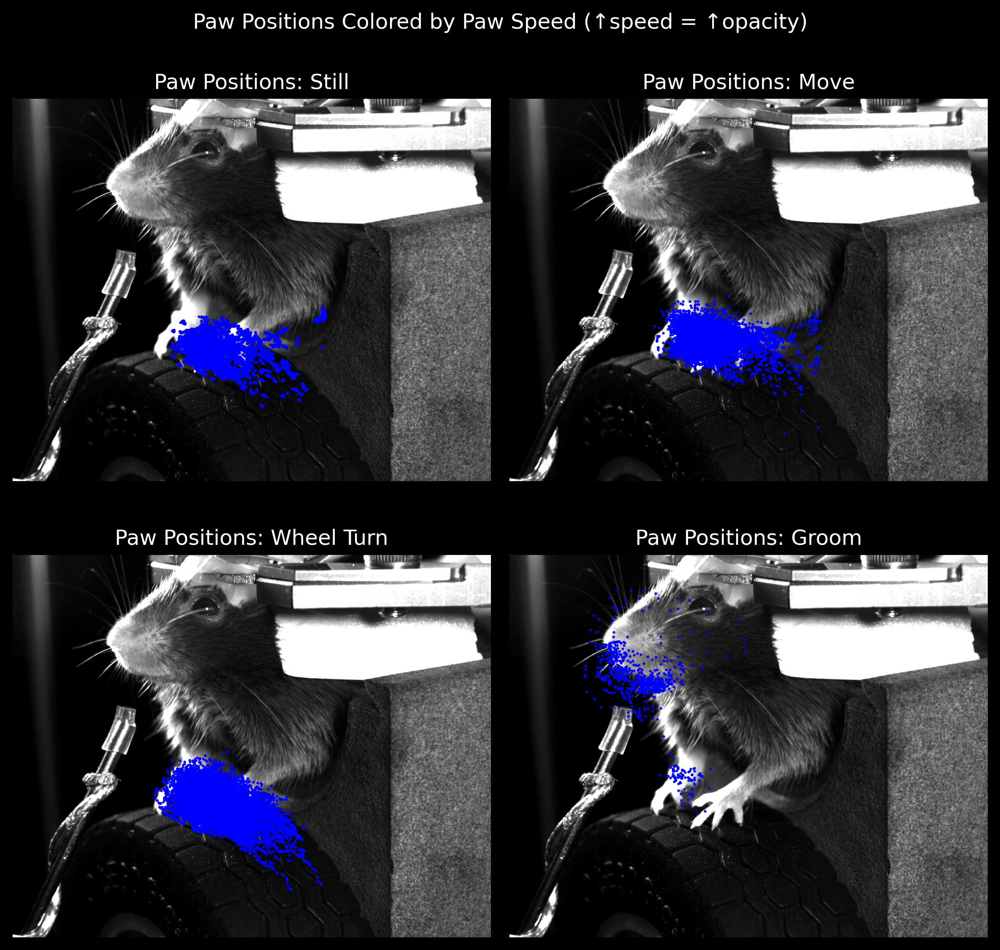

In [120]:
# Create a figure with a 1x4 grid of subplots
fig, axs = plt.subplots(2, 2, figsize=(8, 8), dpi=300)
states = state_labels # ['Still', 'Move', 'Wheel Turn', 'Groom']

for ax, state in zip(axs.flatten(), states):
    # Filter data for the current state
    state_data = frame_marker_df[frame_marker_df['e_mode'] == state]
    
    # Plot the base frame
    ax.imshow(frame)
    
    # Overlay points with alpha based on speed
    sc = ax.scatter(
        state_data['paw_x_pos'],
        state_data['paw_y_pos'],
        c='blue',
        alpha=1,
        marker='.',
        s=1,  # Marker size
        label=f'{state} paw positions'
    )
    
    ax.set_title(f"Paw Positions: {state}")
    ax.axis('off')  # Hide axes for better visualization

# Add a colorbar
plt.suptitle("Paw Positions Colored by Paw Speed (↑speed = ↑opacity)", fontsize=12)

plt.tight_layout()
plt.show()

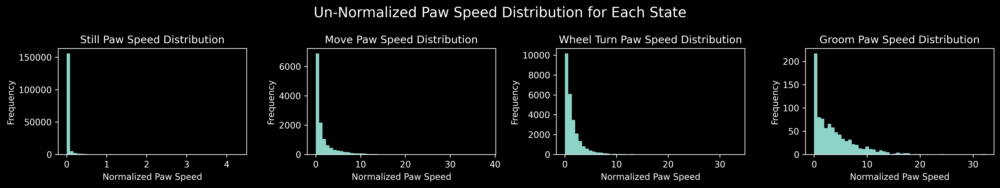

In [ ]:
fig, ax = plt.subplots(1, 4, figsize=(16, 3), dpi=300)
frame_marker_df[frame_marker_df['e_mode'] == "Still"]['paw_speed'].hist(bins=50, ax=ax[0])
frame_marker_df[frame_marker_df['e_mode'] == "Move"]['paw_speed'].hist(bins=50, ax=ax[1])
frame_marker_df[frame_marker_df['e_mode'] == "Wheel Turn"]['paw_speed'].hist(bins=50, ax=ax[2])
frame_marker_df[frame_marker_df['e_mode'] == "Groom"]['paw_speed'].hist(bins=50, ax=ax[3])

for i, state in enumerate(states):
    ax[i].set_title(f"{state} Paw Speed Distribution")
    ax[i].set_xlabel("Normalized Paw Speed")
    ax[i].set_ylabel("Frequency")
    ax[i].grid()

plt.suptitle("Un-Normalized Paw Speed Distribution for Each State", fontsize=16)

plt.tight_layout()

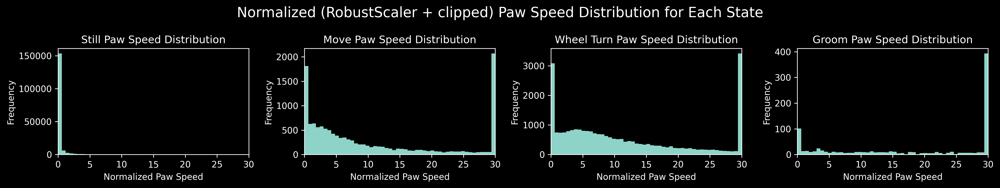

In [122]:
fig, ax = plt.subplots(1, 4, figsize=(16, 3), dpi=300)
frame_marker_df[frame_marker_df['e_mode'] == "Still"]['paw_speed_normalized'].hist(bins=50, ax=ax[0])
frame_marker_df[frame_marker_df['e_mode'] == "Move"]['paw_speed_normalized'].hist(bins=50, ax=ax[1])
frame_marker_df[frame_marker_df['e_mode'] == "Wheel Turn"]['paw_speed_normalized'].hist(bins=50, ax=ax[2])
frame_marker_df[frame_marker_df['e_mode'] == "Groom"]['paw_speed_normalized'].hist(bins=50, ax=ax[3])

for i, state in enumerate(states):
    ax[i].set_title(f"{state} Paw Speed Distribution")
    ax[i].set_xlabel("Normalized Paw Speed")
    ax[i].set_ylabel("Frequency")
    ax[i].set_xlim(0, 30)
    ax[i].grid()

plt.suptitle("Normalized (RobustScaler + clipped) Paw Speed Distribution for Each State", fontsize=16)

plt.tight_layout()

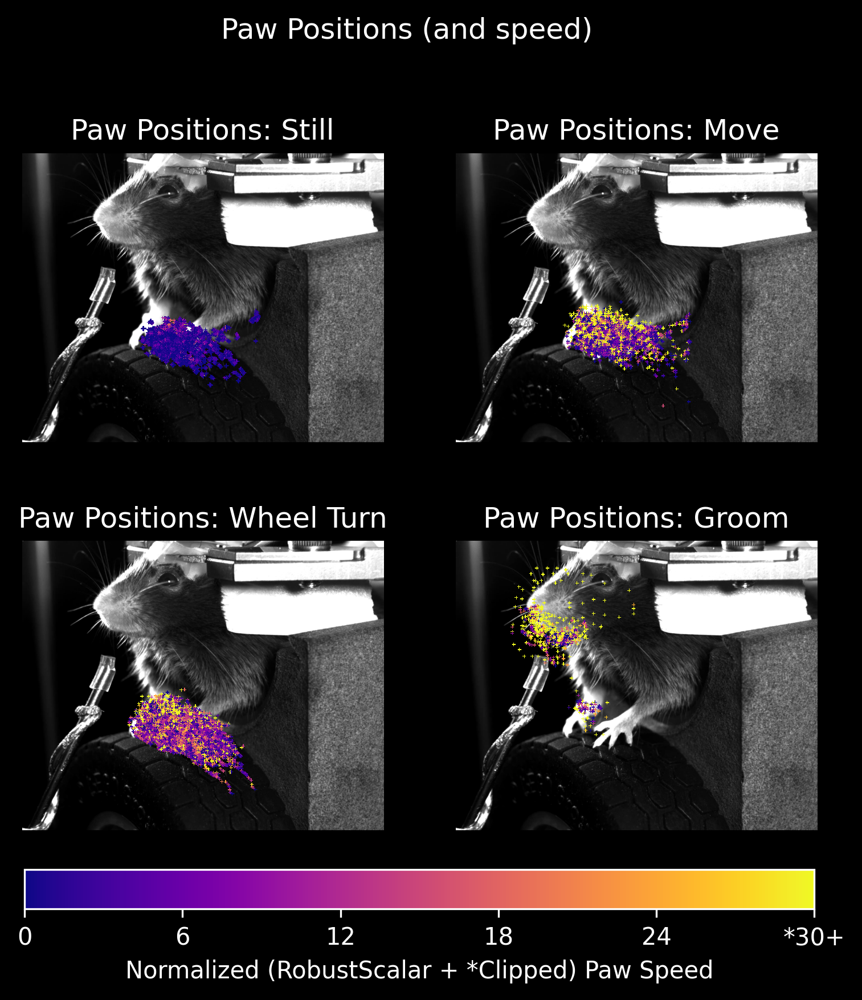

In [123]:
from matplotlib import cm
# Create a figure with a 1x4 grid of subplots
fig, axs = plt.subplots(2, 2, figsize=(6, 6), dpi=300)
states = state_labels # ['Still', 'Move', 'Wheel Turn', 'Groom']

cmap = getattr(cm, "plasma_r", cm.hot_r)

for ax, state in zip(axs.flatten(), states):
    # Filter data for the current state
    state_data = frame_marker_df[frame_marker_df['e_mode'] == state]
    
    # Plot the base frame
    ax.imshow(frame)
    
    # Overlay points with alpha based on speed
    sc = ax.scatter(
        state_data['paw_x_pos'],
        state_data['paw_y_pos'],
        c=state_data['paw_speed_normalized'],
        # cmap="inferno",
        cmap="plasma",
        alpha=1,
        marker='+',
        s=0.1,  # Marker size
        label=f'{state} paw positions'
    )
    
    ax.set_title(f"Paw Positions: {state}")
    ax.axis('off')  # Hide axes for better visualization

# Add a colorbar

cbar = fig.colorbar(sc, ax=axs, orientation='horizontal', fraction=0.05, pad=0.05)
cbar.set_label("Normalized (RobustScalar + *Clipped) Paw Speed")
cbar.set_ticks([0, 6, 12, 18, 24, 30])
cbar.set_ticklabels([0, 6, 12, 18, 24, "*30+"])


plt.suptitle("Paw Positions (and speed)", fontsize=12)

# plt.tight_layout()
plt.show()